## Task 2

##### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import tqdm

In [2]:
#Training data
data=pd.read_excel('train.xlsx')
#Testing data
data2=pd.read_excel('test.xlsx')

In [3]:
data.sample(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,target
10713,-65,-58,-67,-72,-56,-50,-55,-68,-68,-62,-60,-64,-61,-55,-57,-61,-58,-67,A52
19659,-65,-68,-61,-65,-59,-63,-56,-59,-55,-66,-71,-64,-66,-54,-58,-47,-63,-58,B52
35530,-68,-67,-70,-67,-67,-57,-61,-73,-60,-67,-74,-81,-66,-63,-66,-52,-54,-60,A69
1521,-70,-95,-95,-95,-95,-95,-95,-95,-80,-95,-67,-95,-95,-70,-95,-75,-76,-95,A2
28157,-64,-69,-65,-61,-61,-66,-75,-76,-82,-67,-63,-79,-59,-74,-61,-65,-70,-79,A34


In [4]:
data2.sample(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18
6255,-71,-65,-66,-76,-59,-56,-55,-50,-49,-82,-66,-76,-75,-68,-61,-62,-51,-45
11070,-67,-84,-71,-63,-62,-63,-62,-74,-60,-95,-83,-73,-69,-64,-38,-57,-74,-67
2514,-70,-61,-66,-53,-51,-63,-79,-57,-76,-78,-67,-66,-61,-59,-73,-75,-64,-77
3773,-62,-59,-62,-58,-60,-70,-51,-55,-61,-62,-65,-68,-70,-46,-57,-53,-62,-67
960,-67,-59,-59,-61,-52,-39,-59,-76,-50,-68,-72,-68,-59,-47,-58,-54,-67,-59


## How big is our data

In [5]:
print(data.shape)
print(data2.shape)

(36752, 19)
(15752, 18)


## info about each column

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36752 entries, 0 to 36751
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   T1      36752 non-null  int64 
 1   T2      36752 non-null  int64 
 2   T3      36752 non-null  int64 
 3   T4      36752 non-null  int64 
 4   T5      36752 non-null  int64 
 5   T6      36752 non-null  int64 
 6   T7      36752 non-null  int64 
 7   T8      36752 non-null  int64 
 8   T9      36752 non-null  int64 
 9   T10     36752 non-null  int64 
 10  T11     36752 non-null  int64 
 11  T12     36752 non-null  int64 
 12  T13     36752 non-null  int64 
 13  T14     36752 non-null  int64 
 14  T15     36752 non-null  int64 
 15  T16     36752 non-null  int64 
 16  T17     36752 non-null  int64 
 17  T18     36752 non-null  int64 
 18  target  36752 non-null  object
dtypes: int64(18), object(1)
memory usage: 5.3+ MB


In [7]:
data2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15752 entries, 0 to 15751
Data columns (total 18 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   T1      15752 non-null  int64
 1   T2      15752 non-null  int64
 2   T3      15752 non-null  int64
 3   T4      15752 non-null  int64
 4   T5      15752 non-null  int64
 5   T6      15752 non-null  int64
 6   T7      15752 non-null  int64
 7   T8      15752 non-null  int64
 8   T9      15752 non-null  int64
 9   T10     15752 non-null  int64
 10  T11     15752 non-null  int64
 11  T12     15752 non-null  int64
 12  T13     15752 non-null  int64
 13  T14     15752 non-null  int64
 14  T15     15752 non-null  int64
 15  T16     15752 non-null  int64
 16  T17     15752 non-null  int64
 17  T18     15752 non-null  int64
dtypes: int64(18)
memory usage: 2.2 MB


## Check for missing Values

In [8]:
data.isnull().sum()

T1        0
T2        0
T3        0
T4        0
T5        0
T6        0
T7        0
T8        0
T9        0
T10       0
T11       0
T12       0
T13       0
T14       0
T15       0
T16       0
T17       0
T18       0
target    0
dtype: int64

In [9]:
data2.isnull().sum()

T1     0
T2     0
T3     0
T4     0
T5     0
T6     0
T7     0
T8     0
T9     0
T10    0
T11    0
T12    0
T13    0
T14    0
T15    0
T16    0
T17    0
T18    0
dtype: int64

In [10]:
data.describe()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18
count,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000,36752.000000
mean,-65.865449,-64.521931,-64.574472,-65.296474,-64.462152,-63.318731,-67.030202,-66.591260,-65.692479,-65.555181,-65.681922,-66.244204,-63.962614,-64.399080,-64.550011,-64.136782,-65.910726,-66.590417
std,8.737286,8.914559,8.154517,8.142803,8.068375,8.651501,9.257529,10.160193,10.598247,10.408147,9.453958,8.866239,8.254217,9.562839,9.207343,10.540542,10.071973,10.600992
min,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000,-95.000000
25%,-72.000000,-70.000000,-70.000000,-70.000000,-69.000000,-69.000000,-74.000000,-75.000000,-73.000000,-73.000000,-71.000000,-72.000000,-69.000000,-70.000000,-70.000000,-71.000000,-72.000000,-74.000000
50%,-66.000000,-65.000000,-64.000000,-66.000000,-65.000000,-63.000000,-66.000000,-66.000000,-65.000000,-65.000000,-65.000000,-66.000000,-63.000000,-64.000000,-65.000000,-63.000000,-65.000000,-66.000000
75%,-61.000000,-59.000000,-59.000000,-61.000000,-59.000000,-57.000000,-60.000000,-59.000000,-58.000000,-58.000000,-59.000000,-61.000000,-58.000000,-58.000000,-58.000000,-57.000000,-59.000000,-59.000000
max,-41.000000,-37.000000,-41.000000,-39.000000,-36.000000,-39.000000,-45.000000,-39.000000,-39.000000,-37.000000,-40.000000,-43.000000,-43.000000,-39.000000,-38.000000,-40.000000,-43.000000,-39.000000


## Check duplicates

In [11]:
data.duplicated().sum()

1267

In [12]:
data2.duplicated().sum()

327

## How much correlated the columns are

In [13]:
cor=data.corr() #how each column is correlated with others

### Plot to show correlation

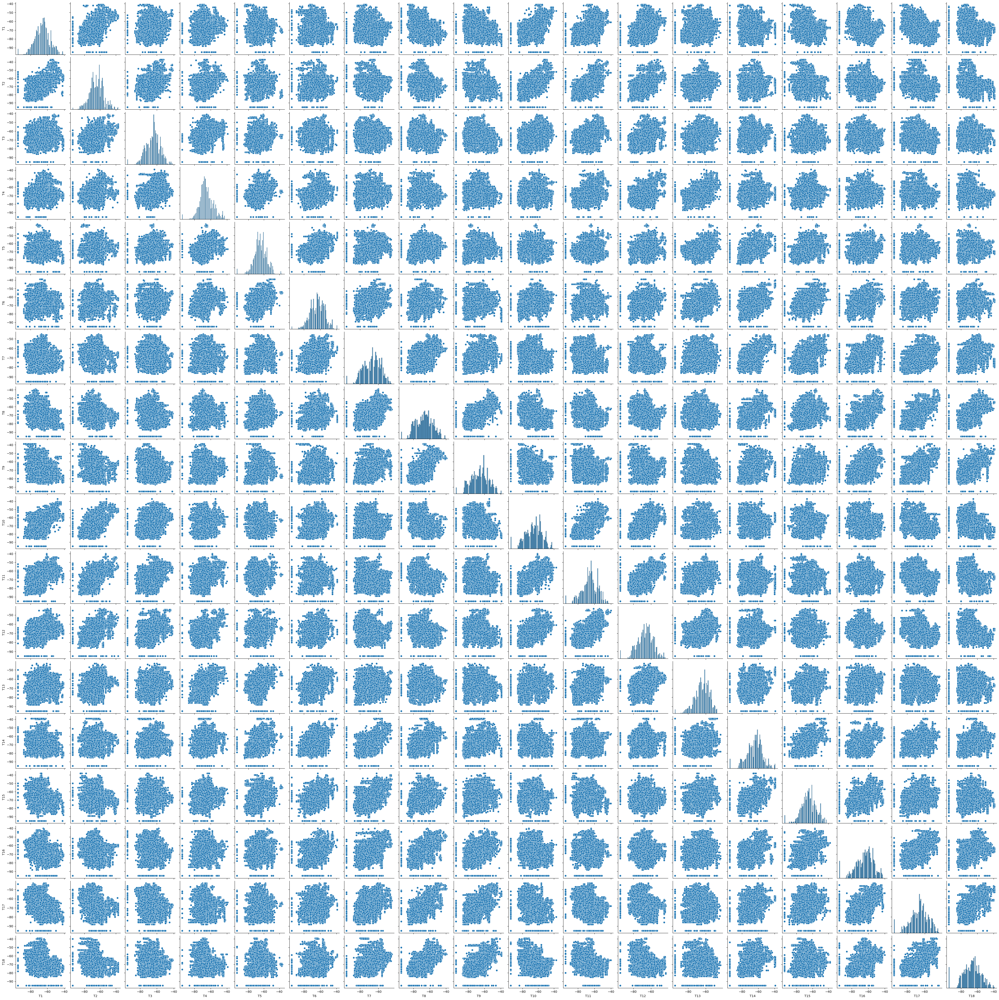

In [14]:
sns.pairplot(data)
plt.show()

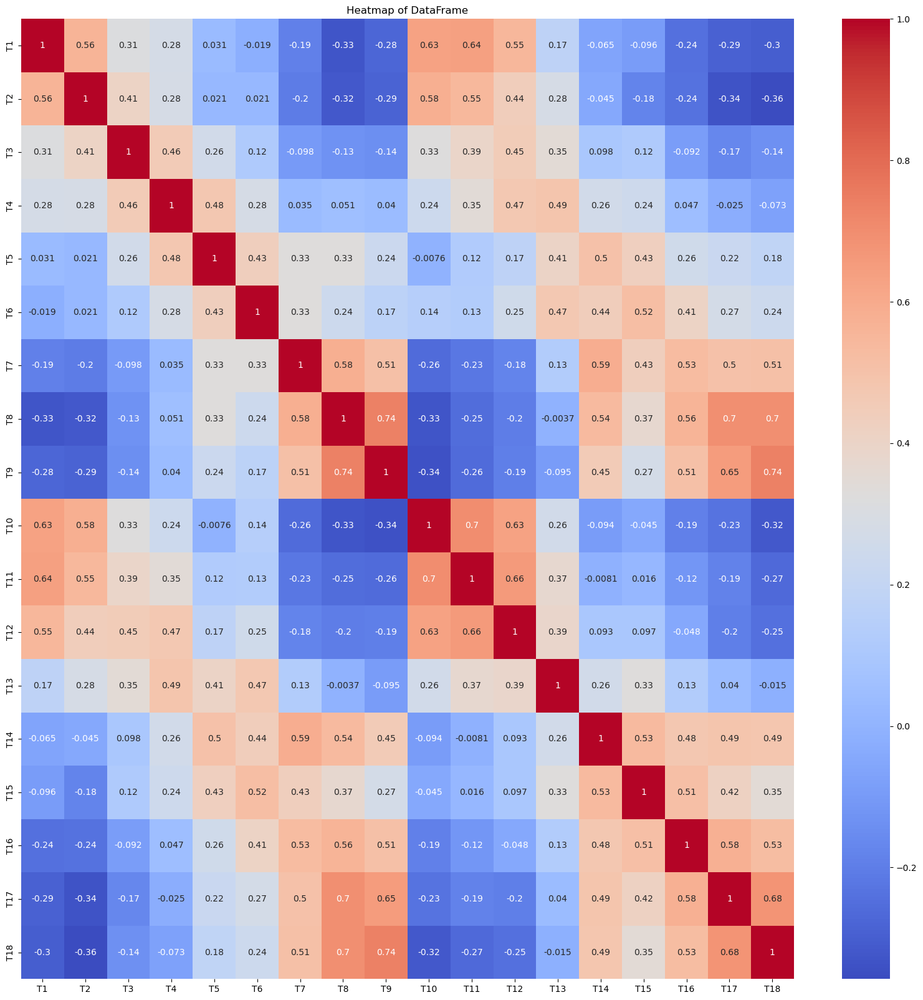

In [15]:
plt.figure(figsize=(20,20))
sns.heatmap(cor, annot=True, cmap='coolwarm')
plt.title('Heatmap of DataFrame')

plt.show()


## Number of output classes

In [14]:
len(set(data.target))

160

## Creating the Matrix of Features and Dependent Variable vector

In [15]:
xtrain=data.iloc[:,:-1]
ytrain=data.iloc[:,-1]
xtest=data2.copy()

In [16]:
xtest.head()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18
0,-76,-83,-70,-66,-64,-72,-64,-69,-60,-76,-83,-78,-81,-81,-81,-70,-60,-60
1,-58,-57,-78,-81,-73,-73,-78,-78,-82,-49,-55,-58,-66,-79,-72,-83,-74,-80
2,-70,-70,-71,-69,-69,-68,-61,-55,-53,-82,-87,-76,-68,-57,-64,-75,-57,-70
3,-71,-61,-56,-56,-61,-60,-68,-66,-72,-58,-55,-56,-58,-62,-61,-59,-64,-65
4,-72,-71,-64,-69,-64,-63,-61,-42,-55,-61,-69,-67,-63,-63,-55,-49,-49,-57


## TASK 2

## No missing values

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36752 entries, 0 to 36751
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   T1      36752 non-null  int64 
 1   T2      36752 non-null  int64 
 2   T3      36752 non-null  int64 
 3   T4      36752 non-null  int64 
 4   T5      36752 non-null  int64 
 5   T6      36752 non-null  int64 
 6   T7      36752 non-null  int64 
 7   T8      36752 non-null  int64 
 8   T9      36752 non-null  int64 
 9   T10     36752 non-null  int64 
 10  T11     36752 non-null  int64 
 11  T12     36752 non-null  int64 
 12  T13     36752 non-null  int64 
 13  T14     36752 non-null  int64 
 14  T15     36752 non-null  int64 
 15  T16     36752 non-null  int64 
 16  T17     36752 non-null  int64 
 17  T18     36752 non-null  int64 
 18  target  36752 non-null  object
dtypes: int64(18), object(1)
memory usage: 5.3+ MB


In [22]:
data.head(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18,target
0,-70,-61,-66,-53,-51,-63,-82,-57,-76,-78,-66,-66,-61,-59,-73,-75,-63,-77,B37
1,-77,-74,-71,-76,-65,-63,-66,-52,-55,-75,-72,-75,-74,-61,-64,-63,-53,-63,B61
2,-53,-38,-55,-66,-62,-62,-65,-70,-62,-52,-56,-53,-66,-68,-72,-60,-68,-77,A19
3,-72,-62,-59,-65,-65,-65,-78,-82,-83,-59,-84,-60,-64,-83,-69,-72,-95,-73,A22
4,-67,-69,-65,-63,-59,-53,-70,-72,-71,-60,-61,-57,-54,-76,-61,-66,-71,-80,A33


In [23]:
data2.head(5)

,T1,T2,T3,T4,T5,T6,T7,T8,T9,T10,T11,T12,T13,T14,T15,T16,T17,T18
0,-76,-83,-70,-66,-64,-72,-64,-69,-60,-76,-83,-78,-81,-81,-81,-70,-60,-60
1,-58,-57,-78,-81,-73,-73,-78,-78,-82,-49,-55,-58,-66,-79,-72,-83,-74,-80
2,-70,-70,-71,-69,-69,-68,-61,-55,-53,-82,-87,-76,-68,-57,-64,-75,-57,-70
3,-71,-61,-56,-56,-61,-60,-68,-66,-72,-58,-55,-56,-58,-62,-61,-59,-64,-65
4,-72,-71,-64,-69,-64,-63,-61,-42,-55,-61,-69,-67,-63,-63,-55,-49,-49,-57


In [24]:
print(data.shape)
print(data2.shape)

(36752, 19)
(15752, 18)


## Dependent variable vector and independent features

In [25]:
x_train=data.iloc[:,:-1] #all columns except last column
y_train=data.iloc[:,-1] #only last column
x_test=data2

In [26]:
from sklearn.preprocessing import StandardScaler 
scaler=StandardScaler()


In [27]:
x_train_sc=scaler.fit_transform(x_train)
#transform only on test data
x_test_sc=scaler.transform(x_test)

### plort the labels

In [28]:
y_train.value_counts()

A39    635
A33    633
A29    432
A3     429
B45    428
      ... 
A27    191
B65    191
A69    190
A18    189
A9     188
Name: target, Length: 160, dtype: int64

## Using Logistic Regression Model

In [29]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
lr=LogisticRegression()

In [30]:
lr.fit(x_train_sc,y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

## Training Accuracy of Model

In [71]:
y_train_pred=lr.predict(x_train_sc)

In [75]:
train_accuracy=accuracy_score(y_train,y_train_pred)
print(f"Training Accuracy:{train_accuracy}")

Training Accuracy:0.9770896821941663


## prediction on testing data

In [88]:
y_pred=lr.predict(x_test_sc)

In [89]:
y_pred

array(['B74', 'A10', 'B65', ..., 'B69', 'A38', 'A80'], dtype=object)

In [90]:
y_pred=pd.DataFrame(y_pred)
y_pred

,0
0,B74
1,A10
2,B65
3,B20
4,A67
...,...
15747,A71
15748,B11
15749,B69
15750,A38


In [91]:
y_pred.to_csv('Logistic_Target_values.csv',index=None)

## Reasons
#### 1) The reason behind choosing the Logistic Regression is that logistic regression provides easily interpretable results.
#### 2) Efficiency: Logistic regression is computationally efficient and can handle large datasets with relative ease.
#### 3) It works well with classification data
#### 4) Effective bias and variance tradeoff

## SVM

In [80]:
from sklearn import svm
clf=svm.SVC(decision_function_shape='ovr',gamma='auto',C=5,kernel='rbf')

In [81]:
clf.fit(x_train_sc,y_train)

SVC(C=5, gamma='auto')

## Training accuracy

In [93]:
y_train_pred2=clf.predict(x_train_sc)

In [94]:
train_accuracy2=accuracy_score(y_train,y_train_pred2)
print(f"Training Accuracy:{train_accuracy2}")

Training Accuracy:0.9937690465824989


## Prediction on testing data

In [84]:
y_pred2=clf.predict(x_test_sc)

In [85]:
y_pred2

array(['B74', 'A10', 'B65', ..., 'B69', 'A38', 'A80'], dtype=object)

In [92]:
y_pred2=pd.DataFrame(y_pred2)
y_pred2.to_csv("SVM_Target_predictions.csv",index=None)

### Reasons for selections
##### 1) Effective in High-Dimentional space
##### 2)Memory efficient: svm uses only a subset of taining points(support vectors) in decision function, making them memory eff
##### 3) versatility in kernels: SVM can use different kernel functions to customize decision boundaries"
##### 4) Effective in case of Non Linearity
##### 5) Robust against overfitting